<a href="https://colab.research.google.com/github/gkpatwardhan/CS445_RayTracer/blob/main/RayTracer_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install tqdm      # for showing progress bar when rendering images
!pip install VectorsPY # for vector 3

In [2]:
# imports
import cv2
import matplotlib.pyplot as plt
from PIL import Image
from tqdm import tqdm
from VectorsPY import Vector3 as Vector3Base
from collections.abc import Callable
import functools
import numpy as np
import random
import math

In [3]:
# Settings types

class Vector3(Vector3Base):
    def __truediv__(self, number: any) -> 'Vector3':
        return Vector3(self.x / number, self.y / number, self.z / number)

    def __mul__(self, other):
        if isinstance(other, Vector3):
            return Vector3(self.x * other.x, self.y * other.y, self.z * other.z)
        elif isinstance(other, (int, float)):
            return Vector3(self.x * other, self.y * other, self.z * other)
        else:
            return Vector3(self.x * other, self.y * other, self.z * other)

    def __rmul__(self, other):
        return self.__mul__(other)

    def __add__(self, other):
        if isinstance(other, Vector3):
            return Vector3(self.x + other.x, self.y + other.y, self.z + other.z)
        elif isinstance(other, float):
            return Vector3(self.x + other, self.y + other, self.z + other)

    def __sub__(self, vec: 'Vector3'):
        return Vector3(self.x - vec.x, self.y - vec.y, self.z - vec.z)

    def unit_vector(self) -> 'Vector3':
        return self / self.magnitude()

    def dot(self, other_vec: 'Vector3') -> float:
        return (self.x * other_vec.x) + (self.y * other_vec.y) + (self.z * other_vec.z)

    def cross(self, other_vec: 'Vector3') -> 'Vector3':
        return Vector3(
                self.y * other_vec.z - self.z * other_vec.y,
                self.z * other_vec.x - self.x * other_vec.z,
                self.x * other_vec.y - self.y * other_vec.x
              )

    def __str__(self) -> str:
      return f'<{self.x}, {self.y}, {self.z}>'

    def length_squared(self) -> float:
        return self.dot(self)

    def sqrt(self):
        return Vector3(np.sqrt(self.x), np.sqrt(self.y), np.sqrt(self.z))

    def __neg__(self):
        return Vector3(-self.x, -self.y, -self.z)

    def __gt__(self, other):
        if isinstance(other, (int, float)):
            return self.length_squared() > other**2
        elif isinstance(other, Vector3):
            return self.x > other.x and self.y > other.y and self.z > other.z
        else:
            raise TypeError("Unsupported operand type(s) for >: '%s' and '%s'" % (type(self), type(other)))

    def __le__(self, other):
        if isinstance(other, (int, float)):
            return self.length_squared() <= other**2
        elif isinstance(other, Vector3):
            return self.x <= other.x and self.y <= other.y and self.z <= other.z
        else:
            raise TypeError("Unsupported operand type(s) for <=: '%s' and '%s'" % (type(self), type(other)))

    @staticmethod
    def random_vector():
        return Vector3(random.random(), random.random(), random.random())

    @staticmethod
    def random_vector_range(min: float, max: float):
        return Vector3(random.uniform(min, max), random.uniform(min, max), random.uniform(min, max))

    def random_in_unit_sphere():
        while True:
            p = Vector3.random_vector_range(-1, 1)
            if p.length_squared() < 1:
                return p

    def random_unit_vector():
        return Vector3.random_in_unit_sphere().unit_vector()

    def random_on_hemisphere(normal):
        on_unit_sphere = Vector3.random_unit_vector()
        if on_unit_sphere.dot(normal) > 0.0:
            return on_unit_sphere
        else:
            return -on_unit_sphere

    def near_zero(self) -> bool:
        s = 1e-8
        return (abs(self.x) < s) and (abs(self.y) < s) and (abs(self.z) < s)

    def reflect(incident: 'Vector3', normal: 'Vector3') -> 'Vector3':
        return incident - (2 * incident.dot(normal) * normal)

    def refract(uv: 'Vector3', normal: 'Vector3', etai_over_etat: float) -> 'Vector3':
        cos_theta = np.minimum(normal.dot(uv * -1), 1.0)
        r_out_perp = (uv + normal * cos_theta) * etai_over_etat
        r_out_parallel_scalar = np.sqrt(np.abs(1.0 - r_out_perp.length_squared()))
        r_out_parallel = normal * (-r_out_parallel_scalar)
        return r_out_perp + r_out_parallel

# create two aliases for vector 3 -- one for point and another for color
Point = Vector3
Color = Vector3

In [4]:
# Color helper functions
def write_color(pixel_color: Color) -> str:
    return f"{int(255.999 * (pixel_color.x))} {int(255.999 * (pixel_color.y))} {int(255.999 * (pixel_color.z))}\n"

In [5]:
# Create PPM helper function
def create_ppm(ppm_file: str, image_width, image_height, pixel_color: Callable[[int, int], Color]) -> None:
    ppm_image = open(ppm_file, 'w')
    height = width = 256
    ppm_image.write(f"P3\n{image_width} {image_height}\n255\n")
    for h in tqdm(range(image_height)):
        for w in range(image_width):
            ppm_image.write(write_color(pixel_color(h, w)))
    ppm_image.close()

    img = cv2.imread(ppm_file)
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.show()

100%|████████████████████████████████████████████████████████████████████████████████████████| 256/256 [00:00<00:00, 8526.84it/s]


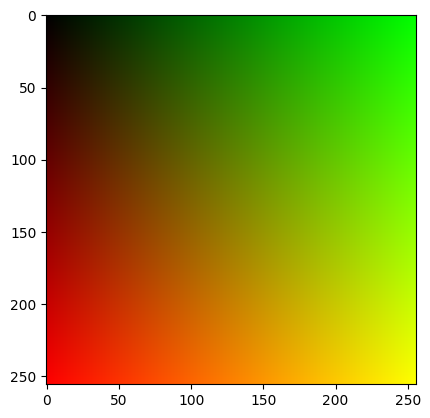

In [6]:
# Hello World PPM - ensure this functions correctly as future code will use similar logic to create, store and view PPM images
def hello_world_ppm():
    ppm_file = 'hello_world.ppm'
    height = width = 256
    create_ppm(ppm_file, width, height, lambda h, w: Color(float(h) / (width - 1), float(w) / (height - 1), 0))
hello_world_ppm()

## Rays, a Simple Camera, and Background

In [7]:
# Ray class
class Ray:
    def __init__(self, origin: Point, direction: Vector3):
        self.origin = origin
        self.direction = direction

#     def at(self, time: float) -> Point:
#         return self.origin + (time * self.direction)
    def at(self, time: float) -> Point:

        scaled_direction = Vector3(self.direction.x * time,
                                   self.direction.y * time,
                                   self.direction.z * time)
        return self.origin + scaled_direction



In [8]:
# Raycast image dimensions
aspect_ratio = 16.0 / 9.0
image_width = 400
image_height = max(1, int(image_width / aspect_ratio))

viewport_height = 2.0
viewport_width = viewport_height * float(image_width) / float(image_height)

# Camera properties
focal_length = 1.0
camera_center = Point(0, 0, 0)

viewport_u = Vector3(viewport_width, 0, 0)
viewport_v = Vector3(0, -viewport_height, 0)

pixel_delta_u = viewport_u / image_width
pixel_delta_v = viewport_v / image_height

viewport_upper_left = camera_center - Vector3(0, 0, focal_length) - (viewport_u / 2) - (viewport_v / 2)

100%|█████████████████████████████████████████████████████████████████████████████████████████| 225/225 [00:00<00:00, 801.20it/s]


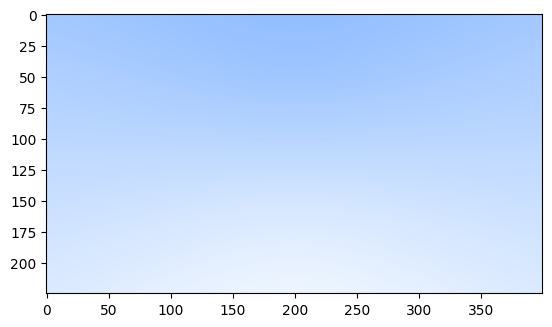

In [9]:
# Skyline PPM -- basic test to ensure Vector, Ray, and aspect ratio math works correctly
pixel00_loc = viewport_upper_left + (pixel_delta_u + pixel_delta_v)*0.5
ppm_file = 'skyline.ppm'

def ray_color(ray: Ray) -> Color:
    unit_direction = ray.direction.unit_vector()
    a = (unit_direction.y + 1.0) * 0.5
    return Color(1.0, 1.0, 1.0)*(1.0-a) + Color(0.5, 0.7, 1.0)*a

def skyline_pixel_color(image_height: int, image_width: int, h: int, w: int) -> Color:
    global pixel_delta_u, pixel_delta_v, pixel00_loc
    pixel_center = pixel00_loc + (pixel_delta_u * w) + (pixel_delta_v * h)
    ray_direction = pixel_center - camera_center
    return ray_color(Ray(camera_center, ray_direction))

create_ppm(ppm_file, image_width, image_height, functools.partial(skyline_pixel_color, image_height, image_width))

## Adding a Sphere

In [10]:
class Sphere:
    def __init__(self, center: Point, radius: float):
        self.center = center
        self.radius = radius

    def hit_sphere(self, ray: Ray) -> bool:
        oc = ray.origin - self.center
        a = ray.direction.dot(ray.direction)
        b = oc.dot(ray.direction) * 2.0
        c = oc.dot(oc) - (self.radius ** 2)
        return ((b*b) - (4*a*c)) >= 0

100%|█████████████████████████████████████████████████████████████████████████████████████████| 225/225 [00:00<00:00, 696.48it/s]


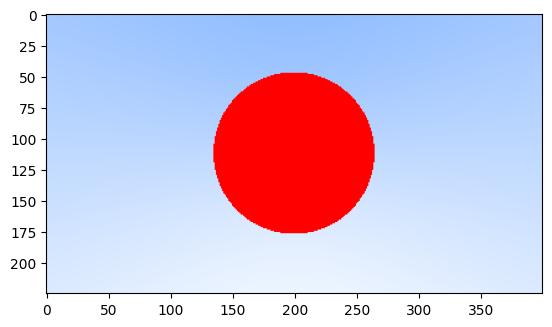

In [11]:
# Raycast sphere (without lighing) -- basic test of sphere ray intersection logic
pixel00_loc = viewport_upper_left + (pixel_delta_u + pixel_delta_v)*0.5
ppm_file = 'solid_sphere.ppm'

def ray_color(sphere: Sphere, ray: Ray) -> Color:
    if (sphere.hit_sphere(ray)):
        return Color(1, 0, 0)
    unit_direction = ray.direction.unit_vector()
    a = (unit_direction.y + 1.0) * 0.5
    return Color(1.0, 1.0, 1.0)*(1.0-a) + Color(0.5, 0.7, 1.0)*a

def solid_sphere_pixel_color(image_height: int, image_width: int, sphere: Sphere, h: int, w: int) -> Color:
    pixel_center = pixel00_loc + (pixel_delta_u * w) + (pixel_delta_v * h)
    ray_direction = pixel_center - camera_center
    return ray_color(sphere, Ray(camera_center, ray_direction))

create_ppm(ppm_file, image_width, image_height, functools.partial(solid_sphere_pixel_color, image_height, image_width, Sphere(Point(0, 0, -1), 0.5)))

## Surface Normals and Multiple Objects

In [12]:
class Sphere:
    def __init__(self, center: Point, radius: float):
        self.center = center
        self.radius = radius

    def hit_sphere(self, ray: Ray) -> bool:
        oc = ray.origin - self.center
        a = ray.direction.dot(ray.direction)
        b = oc.dot(ray.direction) * 2.0
        c = oc.dot(oc) - (self.radius ** 2)
        discriminant = ((b*b) - (4*a*c))
        if discriminant < 0:
            return -1.0
        else:
            return (-b - np.sqrt(discriminant)) / (2.0 * a)

100%|█████████████████████████████████████████████████████████████████████████████████████████| 225/225 [00:00<00:00, 636.87it/s]


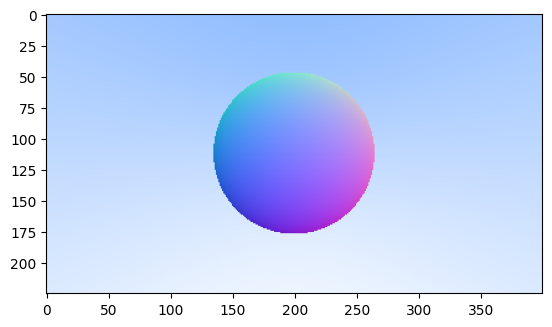

In [13]:
# Raycast sphere with surface normals and multiple objects
pixel00_loc = viewport_upper_left + (pixel_delta_u + pixel_delta_v)*0.5
ppm_file = 'colored_sphere.ppm'

def ray_color(sphere: Sphere, ray: Ray) -> Color:
    t = sphere.hit_sphere(ray)

    if t > 0.0:
        hit_point = ray.at(t)
        normal = (hit_point - sphere.center).unit_vector()
        return Color(normal.x + 1.0, normal.y + 1.0, normal.z + 1.0) * 0.5

    unit_direction = ray.direction.unit_vector()
    a = (unit_direction.y + 1.0) * 0.5
    return Color(1.0, 1.0, 1.0) * (1.0 - a) + Color(0.5, 0.7, 1.0) * a

def solid_sphere_pixel_color(image_height: int, image_width: int, sphere: Sphere, h: int, w: int) -> Color:
    pixel_center = pixel00_loc + (pixel_delta_u * w) + (pixel_delta_v * h)
    ray_direction = pixel_center - camera_center
    return ray_color(sphere, Ray(camera_center, ray_direction))

create_ppm(ppm_file, image_width, image_height, functools.partial(solid_sphere_pixel_color, image_height, image_width, Sphere(Point(0, 0, -1), 0.5)))

### Simplifying Ray-Sphere Intersection

In [14]:
class Interval:
    def __init__(self, min = -np.inf, max = np.inf):
        self.min = min
        self.max = max

    def contains(self, x):
        return self.min <= x and x <= self.max

    def surrounds(self, x):
        return self.min < x and x < self.max

empty: Interval = Interval()
universe: Interval = Interval()

In [15]:
from abc import ABC, abstractmethod

class HitRecord:
    def __init__(self):
        self.point = None
        self.normal = None
        self.t = 0
        self.front_face = False

    def set_face_normal(self, ray, outward_normal):
        self.front_face = ray.direction.dot(outward_normal) < 0
        self.normal = outward_normal if self.front_face else -outward_normal

class Hittable(ABC):
    @abstractmethod
    def hit(self, ray: Ray, interval: Interval) -> tuple[bool, HitRecord]:
        pass


In [16]:
class Sphere(Hittable):
    def __init__(self, center, radius):
        self.center = center
        self.radius = radius

    def hit_sphere(self, ray: Ray) -> float:
        oc = ray.origin - self.center

        a = ray.direction.dot(ray.direction)
        half_b = oc.dot(ray.direction)
        c = oc.dot(oc) - self.radius * self.radius
        discriminant = half_b * half_b - a * c

        if discriminant < 0:
            return -1.0
        else:
            return (-half_b - np.sqrt(discriminant)) / a

    def hit(self, ray: Ray, interval: Interval) -> tuple[bool, HitRecord]:
        oc = ray.origin - self.center
        a = ray.direction.dot(ray.direction)
        half_b = oc.dot(ray.direction)
        c = oc.dot(oc) - self.radius ** 2
        discriminant = half_b**2 - a * c

        if discriminant < 0:
            return (False, None)

        sqrtd = np.sqrt(discriminant)
        root = (-half_b - sqrtd) / a
        if not interval.surrounds(root):
            root = (-half_b + sqrtd) / a
            if not interval.surrounds(root):
                return (False, None)

        hit_record = HitRecord()
        hit_record.t = root
        hit_record.point = ray.at(hit_record.t)
        outward_normal = (hit_record.point - self.center) / self.radius
        hit_record.set_face_normal(ray, outward_normal)

        return (True, hit_record)

In [17]:
class HittableList(Hittable):
    def __init__(self, objects=None):
        self.objects = objects if objects is not None else []

    def clear(self):
        self.objects = []

    def add(self, object):
        self.objects.append(object)

    def hit(self, ray: Ray, interval: Interval) -> tuple[bool, HitRecord]:
        temp_record = HitRecord()
        hit_anything = False
        closest_so_far = interval.max

        for obj in self.objects:
            hit, hit_record = obj.hit(ray, Interval(interval.min, closest_so_far))
            if hit:
                hit_anything = True
                closest_so_far = hit_record.t
                temp_record = hit_record

        return (hit_anything, temp_record)

100%|█████████████████████████████████████████████████████████████████████████████████████████| 225/225 [00:00<00:00, 428.92it/s]


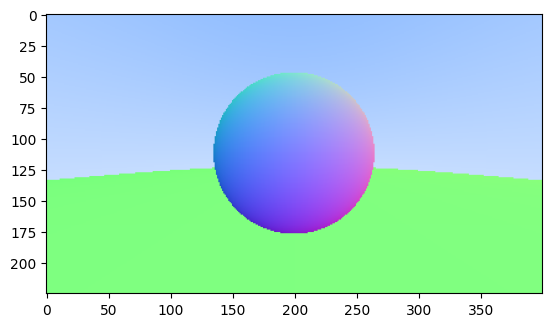

In [18]:
# Raycast sphere with surface normals and multiple objects
pixel00_loc = viewport_upper_left + (pixel_delta_u + pixel_delta_v)*0.5
ppm_file = 'colored_sphere.ppm'

world = HittableList()
world.add(Sphere(Point(0, 0, -1), 0.5))
world.add(Sphere(Point(0, -100.5, -1), 100))

def ray_color(world: HittableList, ray: Ray) -> Color:
    hit, rec = world.hit(ray, Interval(0, np.inf))
    if hit:
        return (Color(rec.normal.x + 1.0, rec.normal.y + 1.0, rec.normal.z + 1.0)) * 0.5

    unit_direction = ray.direction.unit_vector()
    a = (unit_direction.y + 1.0) * 0.5
    return Color(1.0, 1.0, 1.0) * (1.0 - a) + Color(0.5, 0.7, 1.0) * a


def solid_sphere_pixel_color(image_height: int, image_width: int, world: HittableList, h: int, w: int) -> Color:
    pixel_center = pixel00_loc + (pixel_delta_u * w) + (pixel_delta_v * h)
    ray_direction = pixel_center - camera_center
    return ray_color(world, Ray(camera_center, ray_direction))


create_ppm(ppm_file, image_width, image_height, functools.partial(solid_sphere_pixel_color, image_height, image_width, world))


## Moving Camera Code Into Its Own Class

In [19]:
class Camera:
    aspect_ratio  = 1.0
    image_width   = 100

    def render(self, world: Hittable) -> None:
        self.initialize()
        create_ppm(ppm_file, self.image_width, self.image_height, functools.partial(solid_sphere_pixel_color, image_height, image_width, world))

    def initialize(self) -> None:
        global pixel_delta_u, pixel_delta_v, pixel00_loc
        self.image_height = max(1, int(self.image_width / self.aspect_ratio))

        viewport_height = 2.0
        viewport_width = viewport_height * float(self.image_width) / float(self.image_height)

        # Camera properties
        focal_length = 1.0
        camera_center = Point(0, 0, 0)

        viewport_u = Vector3(viewport_width, 0, 0)
        viewport_v = Vector3(0, -viewport_height, 0)

        pixel_delta_u = viewport_u / self.image_width
        pixel_delta_v = viewport_v / self.image_height

        viewport_upper_left = camera_center - Vector3(0, 0, focal_length) - (viewport_u / 2) - (viewport_v / 2)

        pixel00_loc = viewport_upper_left + (pixel_delta_u + pixel_delta_v)*0.5

    def ray_color(self, ray: Ray, world: Hittable) -> Color:
        rec: HitRecord = HitRecord()

        if (world.hit(ray, Interval(0, np.inf), rec)):
            return 0.5 * (rec.normal + Color(1, 1, 1))

        unit_direction = ray.direction.unit_vector()

        a = (unit_direction.y + 1.0) * 0.5
        return Color(1.0, 1.0, 1.0) * (1.0 - a) + Color(0.5, 0.7, 1.0) * a

100%|█████████████████████████████████████████████████████████████████████████████████████████| 225/225 [00:00<00:00, 420.97it/s]


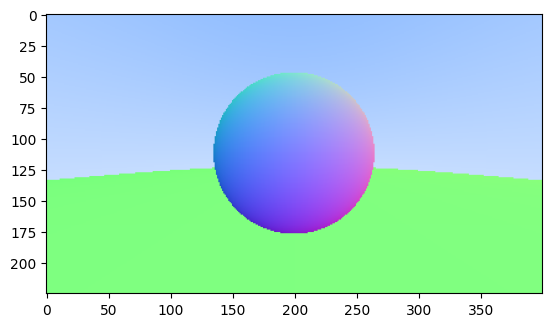

In [20]:
world: HittableList = HittableList()

world.add(Sphere(Point(0, 0, -1), 0.5))
world.add(Sphere(Point(0, -100.5, -1), 100))

camera: Camera = Camera()
camera.aspect_ratio = 16.0 / 9.0
camera.image_width = 400

camera.render(world)

## 8 Antialiasing

In [21]:
class Interval:
    def __init__(self, min = -np.inf, max = np.inf):
        self.min = min
        self.max = max

    def contains(self, x):
        return self.min <= x and x <= self.max

    def surrounds(self, x):
        return self.min < x and x < self.max

    def clamp(self, x):
        return max(self.min, min(x, self.max))

empty: Interval = Interval()
universe: Interval = Interval()

In [22]:
def write_color(pixel_color: Color, samples_per_pixel:int) -> str:

    r = pixel_color.x
    g = pixel_color.y
    b = pixel_color.z

    scale = 1.0 / samples_per_pixel

    r *= scale
    g *= scale
    b *= scale

    intensity = Interval(0.0, 0.999)

    r = intensity.clamp(r)
    g = intensity.clamp(g)
    b = intensity.clamp(b)

    return f"{int(255.999 * r)} {int(255.999 * g)} {int(255.999 * b)}\n"

In [23]:
# Create PPM helper function
def create_ppm(ppm_file: str, image_width, image_height, samples_per_pixel, pixel_color: Callable[[int, int], Color]) -> None:
    ppm_image = open(ppm_file, 'w')
    height = width = 256
    ppm_image.write(f"P3\n{image_width} {image_height}\n255\n")
    for h in tqdm(range(image_height)):
        for w in range(image_width):
            pixel_color = Color(0, 0, 0)
            for sample in range(samples_per_pixel):
                r = camera.get_ray(w,h)
                pixel_color += camera.ray_color(r, world)

            ppm_image.write(write_color(pixel_color, samples_per_pixel))

    ppm_image.close()
    img = cv2.imread(ppm_file)
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.show()

In [24]:
class Camera:
    aspect_ratio  = 1.0
    image_width   = 100
    samples_per_pixel = 10

    def render(self, world: Hittable) -> None:
        self.initialize()
        create_ppm(ppm_file, self.image_width, self.image_height, self.samples_per_pixel, functools.partial(solid_sphere_pixel_color, image_height, image_width, world))

    def initialize(self) -> None:
        global pixel_delta_u, pixel_delta_v, pixel00_loc
        self.image_height = max(1, int(self.image_width / self.aspect_ratio))
        viewport_height = 2.0
        viewport_width = viewport_height * float(self.image_width) / float(self.image_height)

        # Camera properties
        focal_length = 1.0
        camera_center = Point(0, 0, 0)

        viewport_u = Vector3(viewport_width, 0, 0)
        viewport_v = Vector3(0, -viewport_height, 0)

        pixel_delta_u = viewport_u / self.image_width
        pixel_delta_v = viewport_v / self.image_height

        viewport_upper_left = camera_center - Vector3(0, 0, focal_length) - (viewport_u / 2) - (viewport_v / 2)

        pixel00_loc = viewport_upper_left + (pixel_delta_u + pixel_delta_v)*0.5

    def ray_color(self, ray: Ray, world: Hittable) -> Color:
        hit, rec = world.hit(ray, Interval(0, np.inf))
        if hit:
            return 0.5 * (rec.normal + Color(1, 1, 1))

        unit_direction = ray.direction.unit_vector()

        a = (unit_direction.y + 1.0) * 0.5
        return Color(1.0, 1.0, 1.0) * (1.0 - a) + Color(0.5, 0.7, 1.0) * a

    def get_ray(self, i, j):
        pixel_center = pixel00_loc + (i * pixel_delta_u) + (j * pixel_delta_v)
        pixel_sample = pixel_center + self.pixel_sample_square()
        ray_origin = camera_center
        ray_direction = Color(0,0,0)
        ray_direction.x = pixel_sample.x - ray_origin.x
        ray_direction.y = pixel_sample.y - ray_origin.y
        ray_direction.z = pixel_sample.z - ray_origin.z

        return Ray(ray_origin, ray_direction)

    def pixel_sample_square(self):
        px = -0.5 + random.uniform(0,1)
        py = -0.5 + random.uniform(0,1)
        return px * pixel_delta_u + py * pixel_delta_v

100%|██████████| 225/225 [04:11<00:00,  1.12s/it]


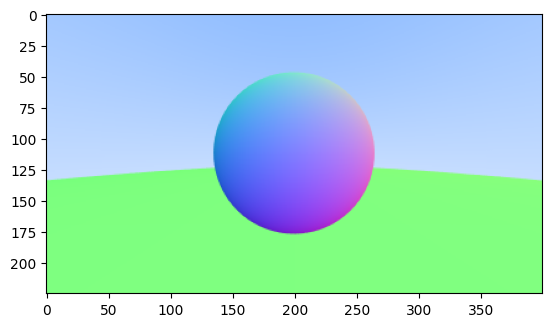

In [25]:
world: HittableList = HittableList()

world.add(Sphere(Point(0, 0, -1), 0.5))
world.add(Sphere(Point(0, -100.5, -1), 100))

camera: Camera = Camera()
camera.aspect_ratio = 16.0 / 9.0
camera.image_width = 400
camera.samples_per_pixel = 100

camera.render(world)

## 9 Diffuse Materials

In [25]:
def linear_to_gamma(linear_color_component: float) -> float:
    return np.sqrt(linear_color_component)

def write_color(pixel_color: Color, samples_per_pixel:int) -> str:

    r = pixel_color.x
    g = pixel_color.y
    b = pixel_color.z

    scale = 1.0 / samples_per_pixel

    r *= scale
    g *= scale
    b *= scale

    r = linear_to_gamma(r)
    g = linear_to_gamma(g)
    b = linear_to_gamma(b)

    intensity = Interval(0.0, 0.999)

    r = intensity.clamp(r)
    g = intensity.clamp(g)
    b = intensity.clamp(b)

    return f"{int(255.999 * r)} {int(255.999 * g)} {int(255.999 * b)}\n"

# Create PPM helper function
def create_ppm(ppm_file: str, image_width, image_height, samples_per_pixel, max_depth, pixel_color: Callable[[int, int], Color]) -> None:
    ppm_image = open(ppm_file, 'w')
    height = width = 256
    ppm_image.write(f"P3\n{image_width} {image_height}\n255\n")
    for h in tqdm(range(image_height)):
        for w in range(image_width):
            pixel_color = Color(0, 0, 0)
            for sample in range(samples_per_pixel):
                r = camera.get_ray(w,h)
                pixel_color += camera.ray_color(r, max_depth, world)

            ppm_image.write(write_color(pixel_color, samples_per_pixel))

    ppm_image.close()
    img = cv2.imread(ppm_file)
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.show()

class Camera:
    aspect_ratio      = 1.0
    image_width       = 100
    samples_per_pixel = 10
    max_depth         = 10 # maximum depth of the ray-color recursion -- maximum light bounces we will consider

    def render(self, world: Hittable) -> None:
        self.initialize()
        create_ppm(ppm_file, self.image_width, self.image_height, self.samples_per_pixel, self.max_depth, functools.partial(solid_sphere_pixel_color, image_height, image_width, world))

    def initialize(self) -> None:
        global pixel_delta_u, pixel_delta_v, pixel00_loc
        self.image_height = max(1, int(self.image_width / self.aspect_ratio))
        viewport_height = 2.0
        viewport_width = viewport_height * float(self.image_width) / float(self.image_height)

        # Camera properties
        focal_length = 1.0
        camera_center = Point(0, 0, 0)

        viewport_u = Vector3(viewport_width, 0, 0)
        viewport_v = Vector3(0, -viewport_height, 0)

        pixel_delta_u = viewport_u / self.image_width
        pixel_delta_v = viewport_v / self.image_height

        viewport_upper_left = camera_center - Vector3(0, 0, focal_length) - (viewport_u / 2) - (viewport_v / 2)

        pixel00_loc = viewport_upper_left + (pixel_delta_u + pixel_delta_v)*0.5

    # Optimization need to set depth to limit number recursion calls to maybe 50 !!!
    def ray_color(self, ray: Ray, depth: int, world: Hittable) -> Color:
        if (depth <= 0):
            return Color(0, 0, 0)
        hit, rec = world.hit(ray, Interval(0.001, np.inf))
        if hit:
            direction = rec.normal + Vector3.random_unit_vector()
            return 0.5 * self.ray_color(Ray(rec.point, direction), depth - 1, world)
        unit_direction = ray.direction.unit_vector()

        a = (unit_direction.y + 1.0) * 0.5
        return Color(1.0, 1.0, 1.0) * (1.0 - a) + Color(0.5, 0.7, 1.0) * a

    def get_ray(self, i, j):
        pixel_center = pixel00_loc + (i * pixel_delta_u) + (j * pixel_delta_v)
        pixel_sample = pixel_center + self.pixel_sample_square()
        ray_origin = camera_center
        ray_direction = Color(0,0,0)
        ray_direction.x = pixel_sample.x - ray_origin.x
        ray_direction.y = pixel_sample.y - ray_origin.y
        ray_direction.z = pixel_sample.z - ray_origin.z

        return Ray(ray_origin, ray_direction)

    def pixel_sample_square(self):
        px = -0.5 + random.uniform(0,1)
        py = -0.5 + random.uniform(0,1)
        return px * pixel_delta_u + py * pixel_delta_v

100%|██████████| 225/225 [07:40<00:00,  2.05s/it]


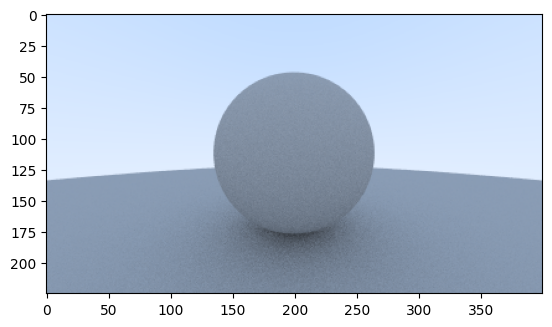

In [27]:
world: HittableList = HittableList()

world.add(Sphere(Point(0, 0, -1), 0.5))
world.add(Sphere(Point(0, -100.5, -1), 100))

camera: Camera = Camera()
camera.aspect_ratio = 16.0 / 9.0
camera.image_width = 400
camera.samples_per_pixel = 100
camera.max_depth = 10

camera.render(world)

## Metal

In [26]:
class Material(ABC):
    @abstractmethod
    def scatter(self, ray_in: Ray, hit_record: HitRecord) -> tuple[bool, Ray, Color]:
        pass

class HitRecord:
    def __init__(self):
        self.point = None
        self.normal = None
        self.t = 0
        self.front_face = False
        self.material = None

    def set_face_normal(self, ray, outward_normal):
        self.front_face = ray.direction.dot(outward_normal) < 0
        self.normal = outward_normal if self.front_face else -outward_normal


class Sphere(Hittable):
    def __init__(self, center: Point, radius: float, material: Material):
        self.center = center
        self.radius = radius
        self.material = material

    def hit_sphere(self, ray: Ray) -> float:
        oc = ray.origin - self.center

        a = ray.direction.dot(ray.direction)
        half_b = oc.dot(ray.direction)
        c = oc.dot(oc) - self.radius * self.radius
        discriminant = half_b * half_b - a * c

        if discriminant < 0:
            return -1.0
        else:
            return (-half_b - np.sqrt(discriminant)) / a

    def hit(self, ray: Ray, interval: Interval) -> tuple[bool, HitRecord]:
        oc = ray.origin - self.center
        a = ray.direction.dot(ray.direction)
        half_b = oc.dot(ray.direction)
        c = oc.dot(oc) - self.radius ** 2
        discriminant = half_b**2 - a * c

        if discriminant < 0:
            return (False, None)

        sqrtd = np.sqrt(discriminant)
        root = (-half_b - sqrtd) / a
        if not interval.surrounds(root):
            root = (-half_b + sqrtd) / a
            if not interval.surrounds(root):
                return (False, None)

        hit_record = HitRecord()
        hit_record.t = root
        hit_record.point = ray.at(hit_record.t)
        outward_normal = (hit_record.point - self.center) / self.radius
        hit_record.material = self.material
        hit_record.set_face_normal(ray, outward_normal)
        hit_record.material = self.material

        return (True, hit_record)

In [27]:
class Lambertian(Material):
    def __init__(self, albedo: Color):
        self.albedo = albedo

    def scatter(self, ray_in: Ray, hit_record: HitRecord) -> tuple[bool, Ray, Color]:
        scatter_direction = hit_record.normal + Vector3.random_unit_vector()
        if (scatter_direction.near_zero()):
            scatter_direction = hit_record.normal
        scattered = Ray(hit_record.point, scatter_direction)
        attenuation = self.albedo
        return (True, scattered, attenuation)

class Metal(Material):
    def __init__(self, albedo: Color, fuzz):
        self.albedo = albedo
        self.fuzz = fuzz if fuzz < 1 else 1

    def scatter(self, ray_in: Ray, hit_record: HitRecord) -> tuple[bool, Ray, Color]:
        reflected = Vector3.reflect(ray_in.direction.unit_vector(), hit_record.normal)
        scattered = Ray(hit_record.point, reflected + (self.fuzz * Vector3.random_unit_vector()))
        attenuation = self.albedo
        return (scattered.direction.dot(hit_record.normal) > 0, scattered, attenuation)

In [28]:
class Camera:
    aspect_ratio      = 1.0
    image_width       = 100
    samples_per_pixel = 10
    max_depth         = 10 # maximum depth of the ray-color recursion -- maximum light bounces we will consider

    def render(self, world: Hittable) -> None:
        self.initialize()
        create_ppm(ppm_file, self.image_width, self.image_height, self.samples_per_pixel, self.max_depth, functools.partial(solid_sphere_pixel_color, image_height, image_width, world))

    def initialize(self) -> None:
        global pixel_delta_u, pixel_delta_v, pixel00_loc
        self.image_height = max(1, int(self.image_width / self.aspect_ratio))
        viewport_height = 2.0
        viewport_width = viewport_height * float(self.image_width) / float(self.image_height)

        # Camera properties
        focal_length = 1.0
        camera_center = Point(0, 0, 0)

        viewport_u = Vector3(viewport_width, 0, 0)
        viewport_v = Vector3(0, -viewport_height, 0)

        pixel_delta_u = viewport_u / self.image_width
        pixel_delta_v = viewport_v / self.image_height

        viewport_upper_left = camera_center - Vector3(0, 0, focal_length) - (viewport_u / 2) - (viewport_v / 2)

        pixel00_loc = viewport_upper_left + (pixel_delta_u + pixel_delta_v)*0.5

    # Optimization need to set depth to limit number recursion calls to maybe 50 !!!
    def ray_color(self, ray: Ray, depth: int, world: Hittable) -> Color:
        if (depth <= 0):
            return Color(0, 0, 0)
        hit, rec = world.hit(ray, Interval(0.001, np.inf))
        if hit:
            scatter, scattered_ray, attenuation = rec.material.scatter(ray, rec)
            if scatter:
                return attenuation * self.ray_color(scattered_ray, depth - 1, world)
            return Color(0, 0, 0)

        unit_direction = ray.direction.unit_vector()
        a = (unit_direction.y + 1.0) * 0.5
        return Color(1.0, 1.0, 1.0) * (1.0 - a) + Color(0.5, 0.7, 1.0) * a

    def get_ray(self, i, j):
        pixel_center = pixel00_loc + (i * pixel_delta_u) + (j * pixel_delta_v)
        pixel_sample = pixel_center + self.pixel_sample_square()
        ray_origin = camera_center
        ray_direction = Color(0,0,0)
        ray_direction.x = pixel_sample.x - ray_origin.x
        ray_direction.y = pixel_sample.y - ray_origin.y
        ray_direction.z = pixel_sample.z - ray_origin.z

        return Ray(ray_origin, ray_direction)

    def pixel_sample_square(self):
        px = -0.5 + random.uniform(0,1)
        py = -0.5 + random.uniform(0,1)
        return px * pixel_delta_u + py * pixel_delta_v

100%|██████████| 225/225 [01:52<00:00,  2.00it/s]


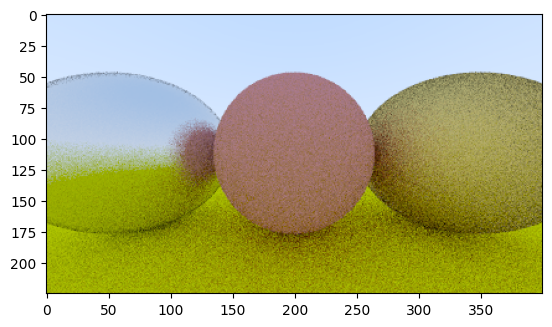

In [31]:
world: HittableList = HittableList()

material_ground = Lambertian(Color(0.8, 0.8, 0))
material_center = Lambertian(Color(0.7, 0.3, 0.3))
material_left = Metal(Color(0.8, 0.8, 0.8), 0.3)
material_right = Metal(Color(0.8, 0.6, 0.2), 1.0)

world.add(Sphere(Point(0, -100.5, -1), 100, material_ground))
world.add(Sphere(Point(0, 0, -1), 0.5, material_center))
world.add(Sphere(Point(-1, 0, -1), 0.5, material_left))
world.add(Sphere(Point(1, 0, -1), 0.5, material_right))

camera: Camera = Camera()
camera.aspect_ratio = 16.0 / 9.0
camera.image_width = 400
camera.samples_per_pixel = 10
camera.max_depth = 10

camera.render(world)

## 11 Dielectrics

In [29]:
class Dielectric(Material):
    def __init__(self, index_of_refraction):
        self.ir = index_of_refraction

    def scatter(self, r_in: Ray, rec: HitRecord) -> tuple[bool, Ray, Color]:
        attenuation = Color(1.0, 1.0, 1.0)
        ri = 1.0 / self.ir if rec.front_face else self.ir

        unit_direction = r_in.direction.unit_vector()
        cos_theta = np.minimum(rec.normal.dot(unit_direction * -1), 1.0)
        sin_theta = np.sqrt(1.0 - (cos_theta * cos_theta))

        cannot_refract = (ri * sin_theta) > 1.0
        direction: Vector3 = None
        if cannot_refract or self.reflectance(cos_theta, ri) > random.uniform(0, 1):
          direction = Vector3.reflect(unit_direction, rec.normal)
        else:
          direction = Vector3.refract(unit_direction, rec.normal, ri)
        scattered_ray = Ray(rec.point, direction)
        return True, scattered_ray, attenuation

    def reflectance(self, cosine: float, refraction_index: float) -> float:
        r0 = (1 - refraction_index) / (1 + refraction_index)
        r0 = r0 * r0
        return r0 + (1 - r0)*math.pow(1 - cosine, 5)

In [30]:
world: HittableList = HittableList()

material_ground = Lambertian(Color(0.8, 0.8, 0))
material_center = Lambertian(Color(0.1, 0.2, 0.5))
material_left = Dielectric(index_of_refraction = 1.5)
material_bubble = Dielectric(index_of_refraction = 1.00 / 1.50)
material_right = Metal(Color(0.8, 0.6, 0.2), 1.0)

100%|██████████| 225/225 [02:57<00:00,  1.27it/s]


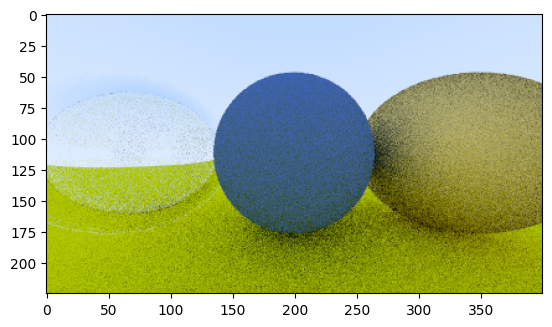

In [55]:
world.add(Sphere(Point(0, -100.5, -1), 100, material_ground))
world.add(Sphere(Point(0, 0, -1), 0.5, material_center))
world.add(Sphere(Point(-1, 0, -1), 0.5, material_left))
world.add(Sphere(Point(-1.0, 0.0, -1.0), 0.4, material_bubble))
world.add(Sphere(Point(1, 0, -1), 0.5, material_right))

camera: Camera = Camera()
camera.aspect_ratio = 16.0 / 9.0
camera.image_width = 400
camera.samples_per_pixel = 10
camera.max_depth = 10

camera.render(world)

In [31]:
# Settings types

class Vector3(Vector3Base):
    def __truediv__(self, number: any) -> 'Vector3':
        return Vector3(self.x / number, self.y / number, self.z / number)

    def __mul__(self, other):
        if isinstance(other, Vector3):
            return Vector3(self.x * other.x, self.y * other.y, self.z * other.z)
        elif isinstance(other, (int, float)):
            return Vector3(self.x * other, self.y * other, self.z * other)
        else:
            return Vector3(self.x * other, self.y * other, self.z * other)

    def __rmul__(self, other):
        return self.__mul__(other)

    def __add__(self, other):
        if isinstance(other, Vector3):
            return Vector3(self.x + other.x, self.y + other.y, self.z + other.z)
        elif isinstance(other, float):
            return Vector3(self.x + other, self.y + other, self.z + other)

    def __sub__(self, vec: 'Vector3'):
        return Vector3(self.x - vec.x, self.y - vec.y, self.z - vec.z)

    def unit_vector(self) -> 'Vector3':
        return self / self.magnitude()

    def dot(self, other_vec: 'Vector3') -> float:
        return (self.x * other_vec.x) + (self.y * other_vec.y) + (self.z * other_vec.z)

    def cross(self, other_vec: 'Vector3') -> 'Vector3':
        return Vector3(
                self.y * other_vec.z - self.z * other_vec.y,
                self.z * other_vec.x - self.x * other_vec.z,
                self.x * other_vec.y - self.y * other_vec.x
              )

    def __str__(self) -> str:
      return f'<{self.x}, {self.y}, {self.z}>'

    def length_squared(self) -> float:
        return self.dot(self)
    
    def length(self):
        return np.sqrt(self.length_squared())

    def sqrt(self):
        return Vector3(np.sqrt(self.x), np.sqrt(self.y), np.sqrt(self.z))

    def __neg__(self):
        return Vector3(-self.x, -self.y, -self.z)

    def __gt__(self, other):
        if isinstance(other, (int, float)):
            return self.length_squared() > other**2
        elif isinstance(other, Vector3):
            return self.x > other.x and self.y > other.y and self.z > other.z
        else:
            raise TypeError("Unsupported operand type(s) for >: '%s' and '%s'" % (type(self), type(other)))

    def __le__(self, other):
        if isinstance(other, (int, float)):
            return self.length_squared() <= other**2
        elif isinstance(other, Vector3):
            return self.x <= other.x and self.y <= other.y and self.z <= other.z
        else:
            raise TypeError("Unsupported operand type(s) for <=: '%s' and '%s'" % (type(self), type(other)))

    @staticmethod
    def random_vector():
        return Vector3(random.random(), random.random(), random.random())

    @staticmethod
    def random_vector_range(min: float, max: float):
        return Vector3(random.uniform(min, max), random.uniform(min, max), random.uniform(min, max))

    def random_in_unit_sphere():
        while True:
            p = Vector3.random_vector_range(-1, 1)
            if p.length_squared() < 1:
                return p

    def random_unit_vector():
        return Vector3.random_in_unit_sphere().unit_vector()
    
    def random_in_unit_disk():
        while True:
            p = Vector3(random.uniform(-1, 1), random.uniform(-1, 1), 0)
            if p.length_squared() < 1:
                return p
        
    def random_on_hemisphere(normal):
        on_unit_sphere = Vector3.random_unit_vector()
        if on_unit_sphere.dot(normal) > 0.0:
            return on_unit_sphere
        else:
            return -on_unit_sphere

    def near_zero(self) -> bool:
        s = 1e-8
        return (abs(self.x) < s) and (abs(self.y) < s) and (abs(self.z) < s)

    def reflect(incident: 'Vector3', normal: 'Vector3') -> 'Vector3':
        return incident - (2 * incident.dot(normal) * normal)

    def refract(uv: 'Vector3', normal: 'Vector3', etai_over_etat: float) -> 'Vector3':
        cos_theta = np.minimum(normal.dot(uv * -1), 1.0)
        r_out_perp = (uv + normal * cos_theta) * etai_over_etat
        r_out_parallel_scalar = np.sqrt(np.abs(1.0 - r_out_perp.length_squared()))
        r_out_parallel = normal * (-r_out_parallel_scalar)
        return r_out_perp + r_out_parallel

# create two aliases for vector 3 -- one for point and another for color
Point = Vector3
Color = Vector3

## Positionable Camera

In [32]:
class Camera:
    aspect_ratio      = 1.0
    image_width       = 100
    samples_per_pixel = 10
    max_depth         = 10    # maximum depth of the ray-color recursion -- maximum light bounces we will consider
    
    vfov              = 90    # vertical view angle (field of view)
    lookfrom = Point(0,0,0)   # camera's origin
    lookat = Point(0,0,-1)  # camera's viewing direction
    vup = Vector3(0,1,0) # camera's vertical up direction

    def render(self, world: Hittable) -> None:
        self.initialize()
        create_ppm(ppm_file, self.image_width, self.image_height, self.samples_per_pixel, self.max_depth, functools.partial(solid_sphere_pixel_color, image_height, image_width, world))

    def initialize(self) -> None:
        global pixel_delta_u, pixel_delta_v, pixel00_loc, camera_center
        self.image_height = max(1, int(self.image_width / self.aspect_ratio))
       
    # Camera properties
        focal_length = (self.lookfrom - self.lookat).length()
        theta = np.radians(self.vfov)
        h = np.tan(theta/2)

        viewport_height = 2 * h * focal_length
        viewport_width = viewport_height * float(self.image_width) / float(self.image_height)

        camera_center = self.lookfrom
 
        self.w = (self.lookfrom - self.lookat).unit_vector()
        self.u = self.vup.cross(self.w).unit_vector()
        self.v = self.w.cross(self.u)
        
        viewport_u = self.u * viewport_width
        viewport_v = self.v * -viewport_height
        
        pixel_delta_u = viewport_u / self.image_width
        pixel_delta_v = viewport_v / self.image_height

        viewport_upper_left = camera_center - (self.w * focal_length) - (viewport_u / 2) - (viewport_v / 2)

        pixel00_loc = viewport_upper_left + (pixel_delta_u + pixel_delta_v)*0.5
        
    def ray_color(self, ray: Ray, depth: int, world: Hittable) -> Color:
        if (depth <= 0):
            return Color(0, 0, 0)
        hit, rec = world.hit(ray, Interval(0.001, np.inf))
        if hit:
            scatter, scattered_ray, attenuation = rec.material.scatter(ray, rec)
            if scatter:
                return attenuation * self.ray_color(scattered_ray, depth - 1, world)
            return Color(0, 0, 0)

        unit_direction = ray.direction.unit_vector()
        a = (unit_direction.y + 1.0) * 0.5
        return Color(1.0, 1.0, 1.0) * (1.0 - a) + Color(0.5, 0.7, 1.0) * a

    def get_ray(self, i, j):
        pixel_center = pixel00_loc + (i * pixel_delta_u) + (j * pixel_delta_v)
        pixel_sample = pixel_center + self.pixel_sample_square()
        ray_origin = camera_center
        ray_direction = Color(0,0,0)
        ray_direction.x = pixel_sample.x - ray_origin.x
        ray_direction.y = pixel_sample.y - ray_origin.y
        ray_direction.z = pixel_sample.z - ray_origin.z

        return Ray(ray_origin, ray_direction)

    def pixel_sample_square(self):
        px = -0.5 + random.uniform(0,1)
        py = -0.5 + random.uniform(0,1)
        return px * pixel_delta_u + py * pixel_delta_v

In [33]:
world: HittableList = HittableList()

material_ground = Lambertian(Color(0.8, 0.8, 0))
material_center = Lambertian(Color(0.1, 0.2, 0.5))
material_left = Dielectric(index_of_refraction = 1.5)
material_bubble = Dielectric(index_of_refraction = 1.00 / 1.50)
material_right = Metal(Color(0.8, 0.6, 0.2), 1.0)

100%|██████████████████████████████████████████████████████████████████████████████████████████████| 225/225 [00:20<00:00, 10.99it/s]


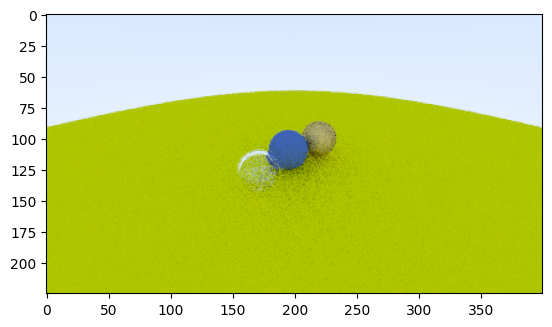

In [106]:
world.add(Sphere(Point(0, -100.5, -1), 100, material_ground))
world.add(Sphere(Point(0, 0, -1.2), 0.5, material_center))
world.add(Sphere(Point(-1, 0, -1), 0.5, material_left))
world.add(Sphere(Point(-1.0, 0.0, -1.0), 0.4, material_bubble))
world.add(Sphere(Point(1, 0, -1), 0.5, material_right))

camera: Camera = Camera()
camera.aspect_ratio = 16.0 / 9.0
camera.image_width = 400
camera.samples_per_pixel = 10
camera.max_depth = 10

camera.vfov = 90
camera.lookfrom = Point(-2, 2, 1)
camera.lookat = Point(0.0, 0.0, -1.0)
camera.vup = Vector3(0.0, 1.0, 0.0)

camera.render(world)

100%|██████████████████████████████████████████████████████████████████████████████████████████████| 225/225 [01:15<00:00,  2.97it/s]


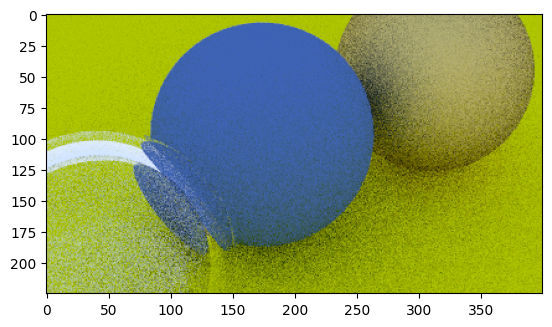

In [107]:
world.add(Sphere(Point(0, -100.5, -1), 100, material_ground))
world.add(Sphere(Point(0, 0, -1.2), 0.5, material_center))
world.add(Sphere(Point(-1, 0, -1), 0.5, material_left))
world.add(Sphere(Point(-1.0, 0.0, -1.0), 0.4, material_bubble))
world.add(Sphere(Point(1, 0, -1), 0.5, material_right))

camera: Camera = Camera()
camera.aspect_ratio = 16.0 / 9.0
camera.image_width = 400
camera.samples_per_pixel = 10
camera.max_depth = 10

camera.vfov = 20
camera.lookfrom = Point(-2, 2, 1)
camera.lookat = Point(0.0, 0.0, -1.0)
camera.vup = Vector3(0.0, 1.0, 0.0)

camera.render(world)

## Defocus Blur

In [34]:
class Camera:
    aspect_ratio      = 1.0
    image_width       = 100
    samples_per_pixel = 10
    max_depth         = 10  # maximum depth of the ray-color recursion -- maximum light bounces we will consider
    
    vfov              = 90             # vertical view angle (field of view)
    lookfrom          = Point(0,0,0)   # camera's origin
    lookat            = Point(0,0,-1)  # camera's viewing direction
    vup               = Vector3(0,1,0) # camera's vertical up direction

    defocus_angle     = 0
    focus_dist        = 0
    
    def render(self, world: Hittable) -> None:
        self.initialize()
        create_ppm(ppm_file, self.image_width, self.image_height, self.samples_per_pixel, self.max_depth, functools.partial(solid_sphere_pixel_color, image_height, image_width, world))

    def initialize(self) -> None:
        global pixel_delta_u, pixel_delta_v, pixel00_loc, camera_center, defocus_disk_u, defocus_disk_v
        self.image_height = max(1, int(self.image_width / self.aspect_ratio))
       
    # Camera properties        
        theta = np.radians(self.vfov)
        h = np.tan(theta/2)

        viewport_height = 2 * h * self.focus_dist
        viewport_width = viewport_height * float(self.image_width) / float(self.image_height)

        camera_center = self.lookfrom
        
        self.w = (self.lookfrom - self.lookat).unit_vector()
        self.u = self.vup.cross(self.w).unit_vector()
        self.v = self.w.cross(self.u)
        
        viewport_u = self.u * viewport_width
        viewport_v = self.v * -viewport_height
        
        pixel_delta_u = viewport_u / self.image_width
        pixel_delta_v = viewport_v / self.image_height

        viewport_upper_left = camera_center - (self.w * self.focus_dist) - (viewport_u / 2) - (viewport_v / 2)
        pixel00_loc = viewport_upper_left + (pixel_delta_u + pixel_delta_v)*0.5
        defocus_radius = self.focus_dist * np.tan(np.radians(self.defocus_angle /2 ))
        defocus_disk_u = self.u * defocus_radius
        defocus_disk_v = self.v * defocus_radius
        
    def ray_color(self, ray: Ray, depth: int, world: Hittable) -> Color:
        if (depth <= 0):
            return Color(0, 0, 0)
        hit, rec = world.hit(ray, Interval(0.001, np.inf))
        if hit:
            scatter, scattered_ray, attenuation = rec.material.scatter(ray, rec)
            if scatter:
                return attenuation * self.ray_color(scattered_ray, depth - 1, world)
            return Color(0, 0, 0)

        unit_direction = ray.direction.unit_vector()
        a = (unit_direction.y + 1.0) * 0.5
        return Color(1.0, 1.0, 1.0) * (1.0 - a) + Color(0.5, 0.7, 1.0) * a

    def get_ray(self, i, j):
        offset = self.pixel_sample_square()
        pixel_sample = pixel00_loc + ((i + offset.x) * pixel_delta_u) + ((j + offset.y) * pixel_delta_v) 
        ray_origin = camera_center if self.defocus_angle <= 0 else self.defocus_disk_sample()
        ray_direction = Color(0,0,0)
        ray_direction.x = pixel_sample.x - ray_origin.x
        ray_direction.y = pixel_sample.y - ray_origin.y
        ray_direction.z = pixel_sample.z - ray_origin.z
        return Ray(ray_origin, ray_direction)
    
    def defocus_disk_sample(self):
        p = Vector3.random_in_unit_disk()
        return camera_center + (p.x * defocus_disk_u) + (p.y * defocus_disk_v)
    
    def pixel_sample_square(self):
        px = -0.5 + random.uniform(0,1)
        py = -0.5 + random.uniform(0,1)
        return px * pixel_delta_u + py * pixel_delta_v

100%|██████████████████████████████████████████████████████████████████████████████████████████████| 225/225 [07:15<00:00,  1.93s/it]


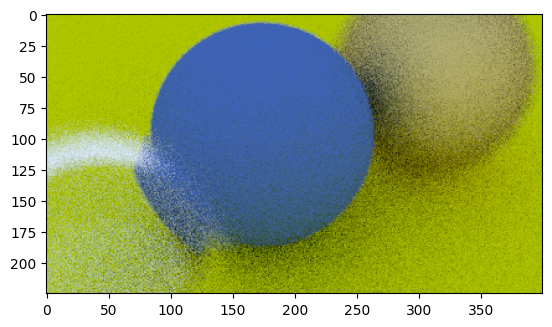

In [139]:
world.add(Sphere(Point(0, -100.5, -1), 100, material_ground))
world.add(Sphere(Point(0, 0, -1.2), 0.5, material_center))
world.add(Sphere(Point(-1, 0, -1), 0.5, material_left))
world.add(Sphere(Point(-1.0, 0.0, -1.0), 0.4, material_bubble))
world.add(Sphere(Point(1, 0, -1), 0.5, material_right))

camera: Camera = Camera()
camera.aspect_ratio = 16.0 / 9.0
camera.image_width = 400
camera.samples_per_pixel = 100   # was set to 10 but needed to be 100
camera.max_depth = 50

camera.vfov = 20
camera.lookfrom = Point(-2, 2, 1)
camera.lookat = Point(0.0, 0.0, -1.0)
camera.vup = Vector3(0.0, 1.0, 0.0)

camera.defocus_angle = 10
camera.focus_dist = 3.4

camera.render(world)

## Final Render

In [35]:
world: HittableList = HittableList()
    
material_ground = Lambertian(Color(0.5, 0.5, 0.5))
world.add(Sphere(Point(0, -1000, 0), 1000, material_ground))

for a in range(-11, 11):
    for b in range(-11, 11):
        choose_mat = random.uniform(0,1)
        center = Point(a * 0.9 * random.uniform(0,1), 0.2, b + 0.9 * random.uniform(0,1))
        if (center - Point(4,0.2,0)).length() > 0.9:
            if choose_mat < 0.8:
                albeto = Color(random.uniform(0,1), random.uniform(0,1), random.uniform(0,1)) * Color(random.uniform(0,1), random.uniform(0,1), random.uniform(0,1))
                sphere_material = Lambertian(albeto)
                world.add(Sphere(center, 0.2, sphere_material))
            elif choose_mat < 0.95:
                fuzz   = random.uniform(0, 0.5)
                albeto = Color(random.uniform(0.5,1), random.uniform(0.5,1), random.uniform(0.5,1))
                sphere_material = Metal(albeto, fuzz)
                world.add(Sphere(center, 0.2, sphere_material))   
            else:
                sphere_material = Dielectric(index_of_refraction = 1.5)
                world.add(Sphere(center, 0.2, sphere_material))
            
            
material1 = Dielectric(index_of_refraction = 1.5)
world.add(Sphere(Point(0, 1, 0), 1., material1))

material2 = Lambertian(Color(0.4, 0.2, 0.1))
world.add(Sphere(Point(-4, 1, 0), 1, material2))

material3 = Metal(Color(0.7, 0.6, 0.5), 0.0)
world.add(Sphere(Point(4, 1, 0), 1, material3))

camera: Camera = Camera()
camera.aspect_ratio = 16.0 / 9.0
camera.image_width = 1200
camera.samples_per_pixel = 10
camera.max_depth = 50

camera.vfov = 20
camera.lookfrom = Point(13, 2, 3)
camera.lookat = Point(0.0, 0.0, 0.0)
camera.vup = Vector3(0.0, 1.0, 0.0)

camera.defocus_angle = 0.6
camera.focus_dist = 18.0

camera.render(world)

  0%|▏                                                                                         | 1/675 [00:08<1:35:40,  8.52s/it]


Unexpected exception formatting exception. Falling back to standard exception


Traceback (most recent call last):
  File "/Users/antanastony/anaconda3/lib/python3.11/site-packages/IPython/core/interactiveshell.py", line 3526, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "/var/folders/tq/lsnwd0c95dx6qq99qdnw05nc0000gn/T/ipykernel_37547/1135959906.py", line 48, in <module>
    camera.render(world)
  File "/var/folders/tq/lsnwd0c95dx6qq99qdnw05nc0000gn/T/ipykernel_37547/642826061.py", line 17, in render
    create_ppm(ppm_file, self.image_width, self.image_height, self.samples_per_pixel, self.max_depth, functools.partial(solid_sphere_pixel_color, image_height, image_width, world))
  File "/var/folders/tq/lsnwd0c95dx6qq99qdnw05nc0000gn/T/ipykernel_37547/3496879388.py", line 38, in create_ppm
    pixel_color += camera.ray_color(r, max_depth, world)
                   ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/var/folders/tq/lsnwd0c95dx6qq99qdnw05nc0000gn/T/ipykernel_37547/642826061.py", line 51, in ray_color
    hit, rec = world.hit(ray

100%|██████████████████████████████████████████████████████████████████████████████████████████| 675/675 [09:57<00:00,  1.13it/s]


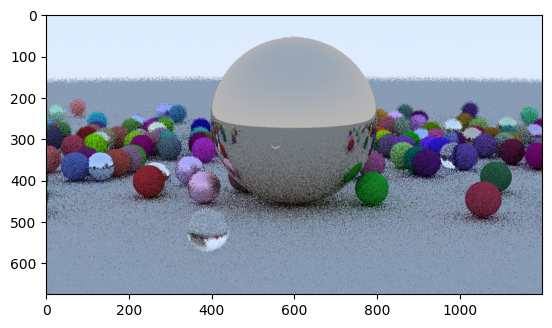

100%|██████████████████████████████████████████████████████████████████████████████████████████| 675/675 [10:19<00:00,  1.09it/s]


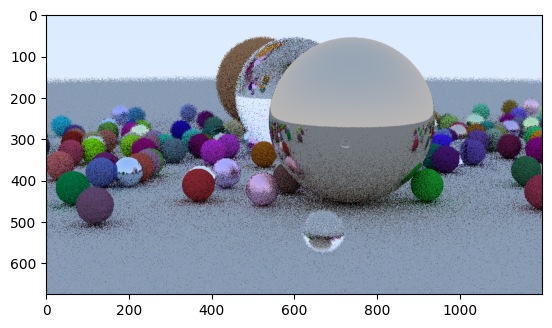

100%|██████████████████████████████████████████████████████████████████████████████████████████| 675/675 [10:48<00:00,  1.04it/s]


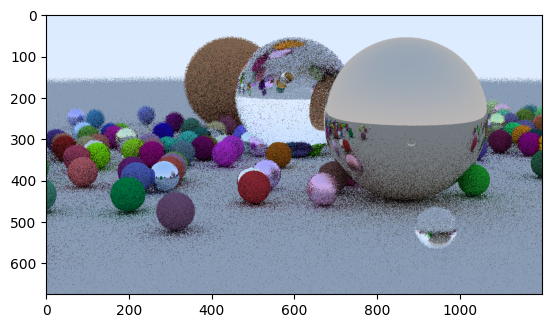

100%|██████████████████████████████████████████████████████████████████████████████████████████| 675/675 [10:59<00:00,  1.02it/s]


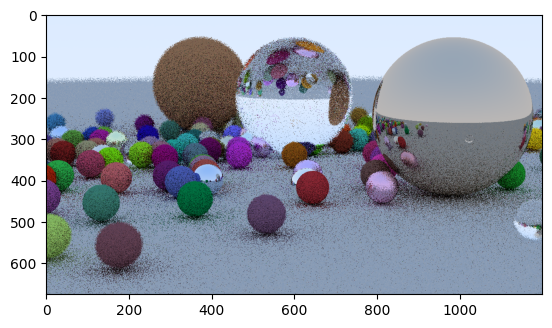

100%|██████████████████████████████████████████████████████████████████████████████████████████| 675/675 [11:02<00:00,  1.02it/s]


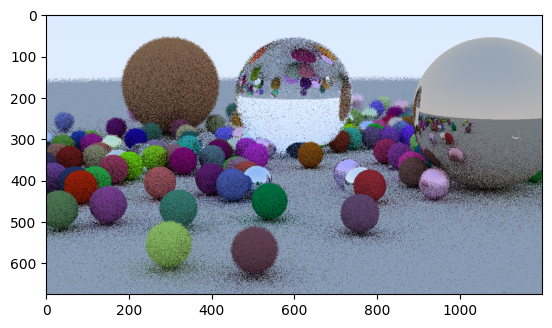

100%|██████████████████████████████████████████████████████████████████████████████████████████| 675/675 [11:09<00:00,  1.01it/s]


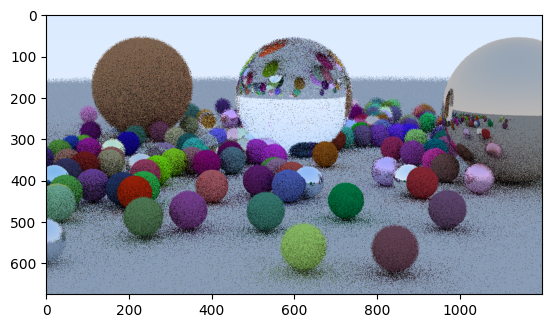

100%|██████████████████████████████████████████████████████████████████████████████████████████| 675/675 [11:13<00:00,  1.00it/s]


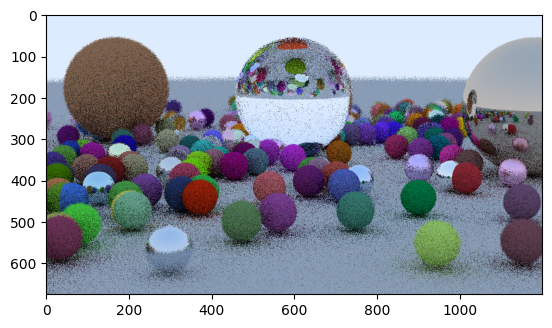

100%|██████████████████████████████████████████████████████████████████████████████████████████| 675/675 [11:13<00:00,  1.00it/s]


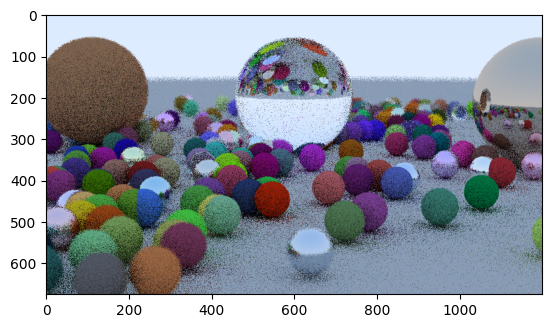

100%|██████████████████████████████████████████████████████████████████████████████████████████| 675/675 [11:31<00:00,  1.02s/it]


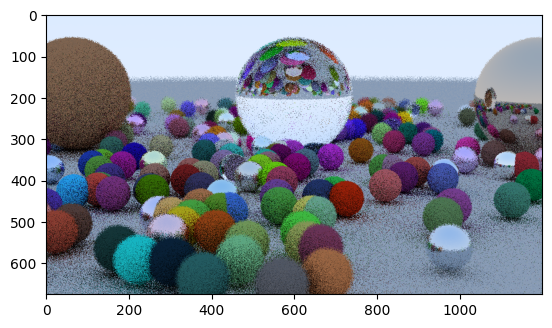

100%|██████████████████████████████████████████████████████████████████████████████████████████| 675/675 [11:36<00:00,  1.03s/it]


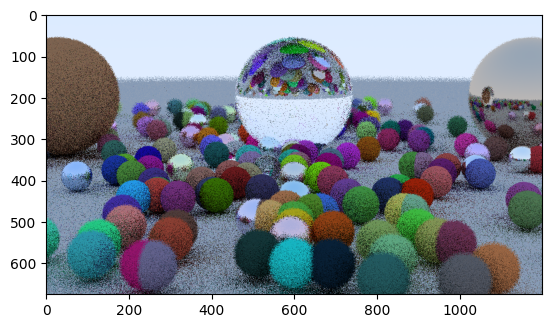

100%|██████████████████████████████████████████████████████████████████████████████████████████| 675/675 [11:39<00:00,  1.04s/it]


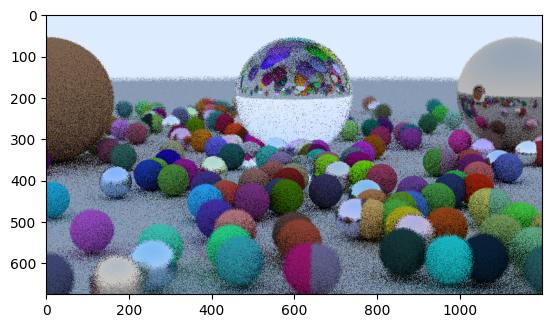

100%|██████████████████████████████████████████████████████████████████████████████████████████| 675/675 [11:27<00:00,  1.02s/it]


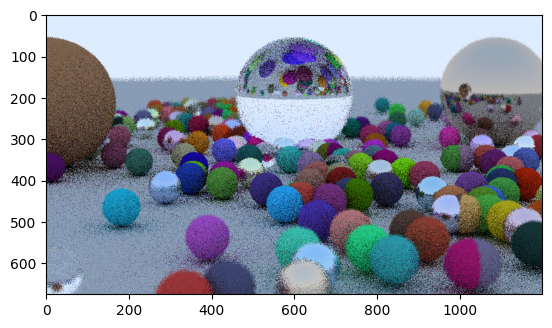

100%|██████████████████████████████████████████████████████████████████████████████████████████| 675/675 [11:04<00:00,  1.02it/s]


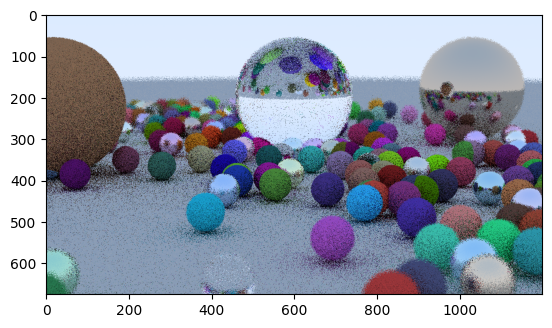

100%|██████████████████████████████████████████████████████████████████████████████████████████| 675/675 [11:00<00:00,  1.02it/s]


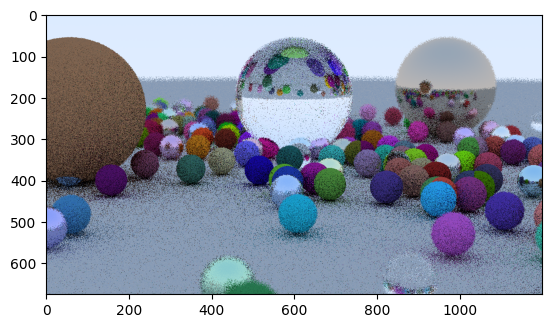

100%|██████████████████████████████████████████████████████████████████████████████████████████| 675/675 [10:56<00:00,  1.03it/s]


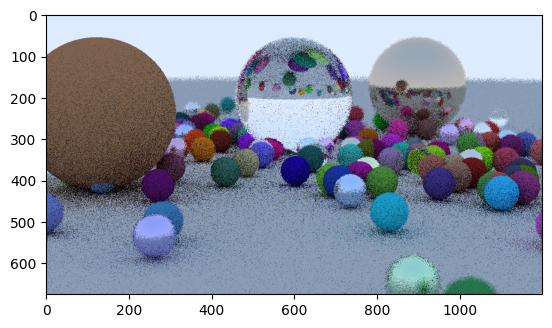

100%|██████████████████████████████████████████████████████████████████████████████████████████| 675/675 [10:57<00:00,  1.03it/s]


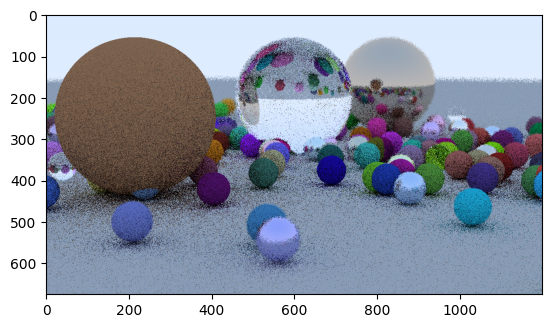

100%|██████████████████████████████████████████████████████████████████████████████████████████| 675/675 [10:50<00:00,  1.04it/s]


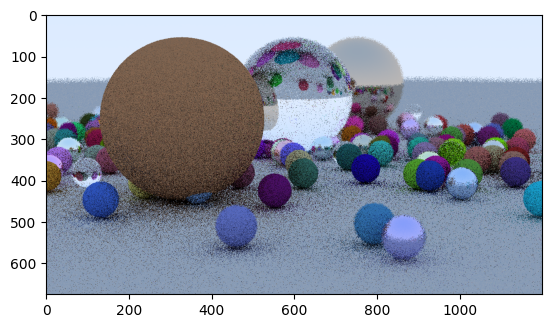

100%|██████████████████████████████████████████████████████████████████████████████████████████| 675/675 [10:18<00:00,  1.09it/s]


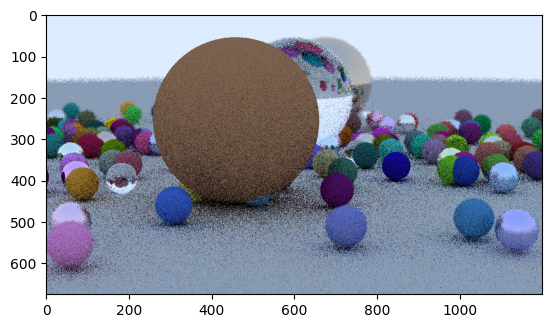

100%|██████████████████████████████████████████████████████████████████████████████████████████| 675/675 [09:49<00:00,  1.15it/s]


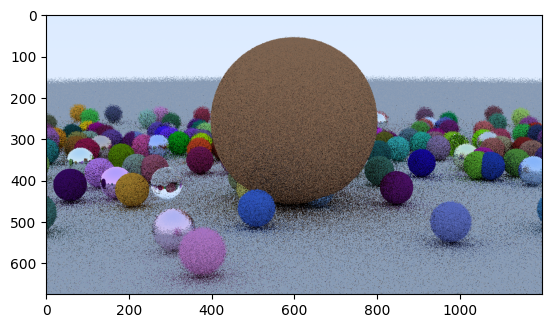

100%|██████████████████████████████████████████████████████████████████████████████████████████| 675/675 [10:08<00:00,  1.11it/s]


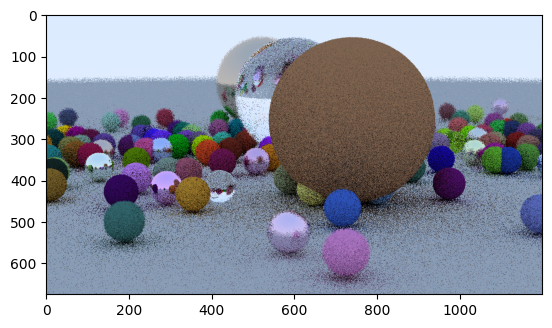

100%|██████████████████████████████████████████████████████████████████████████████████████████| 675/675 [10:42<00:00,  1.05it/s]


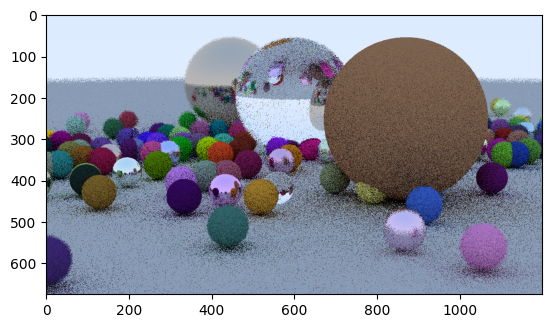

100%|██████████████████████████████████████████████████████████████████████████████████████████| 675/675 [10:53<00:00,  1.03it/s]


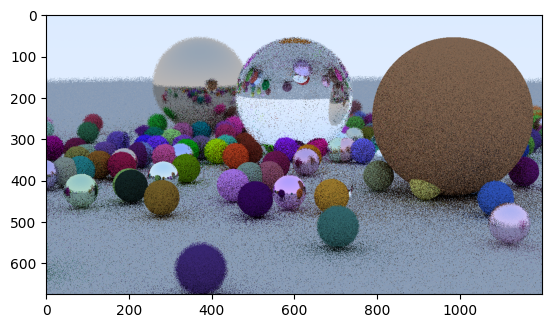

100%|██████████████████████████████████████████████████████████████████████████████████████████| 675/675 [11:01<00:00,  1.02it/s]


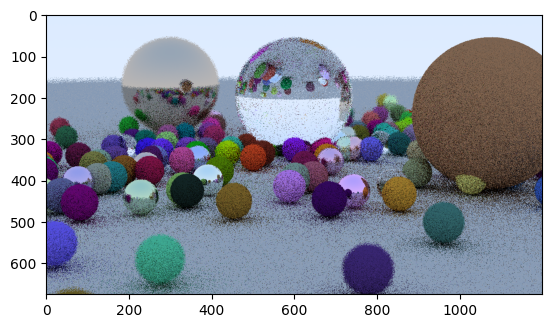

100%|██████████████████████████████████████████████████████████████████████████████████████████| 675/675 [11:02<00:00,  1.02it/s]


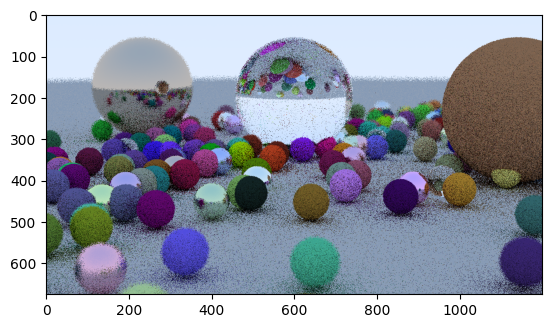

100%|██████████████████████████████████████████████████████████████████████████████████████████| 675/675 [11:22<00:00,  1.01s/it]


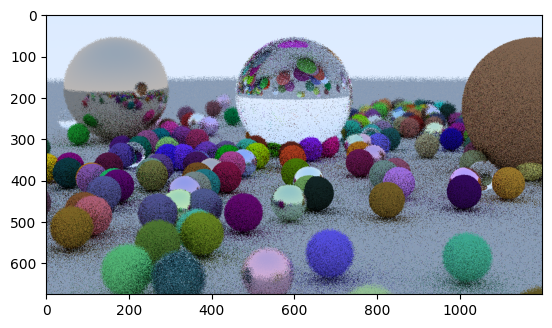

100%|██████████████████████████████████████████████████████████████████████████████████████████| 675/675 [11:35<00:00,  1.03s/it]


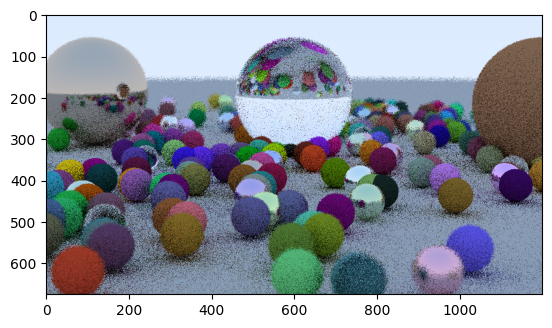

100%|██████████████████████████████████████████████████████████████████████████████████████████| 675/675 [11:49<00:00,  1.05s/it]


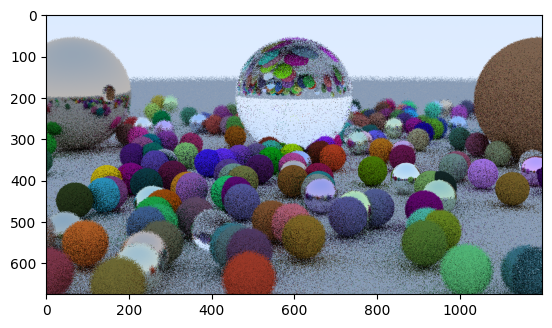

100%|██████████████████████████████████████████████████████████████████████████████████████████| 675/675 [11:33<00:00,  1.03s/it]


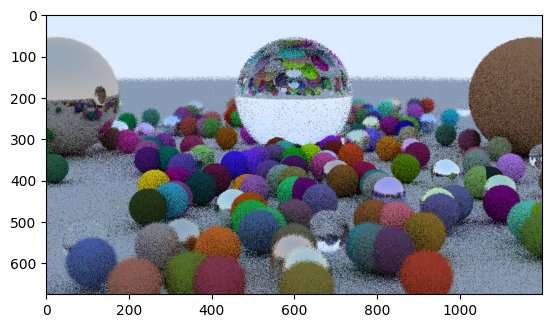

100%|██████████████████████████████████████████████████████████████████████████████████████████| 675/675 [11:31<00:00,  1.03s/it]


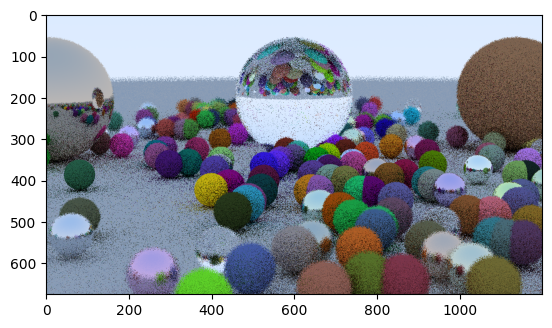

100%|██████████████████████████████████████████████████████████████████████████████████████████| 675/675 [11:18<00:00,  1.01s/it]


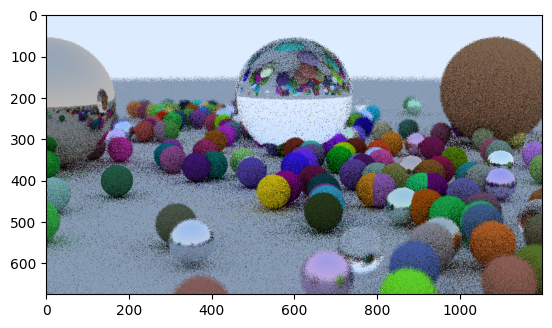

100%|██████████████████████████████████████████████████████████████████████████████████████████| 675/675 [11:16<00:00,  1.00s/it]


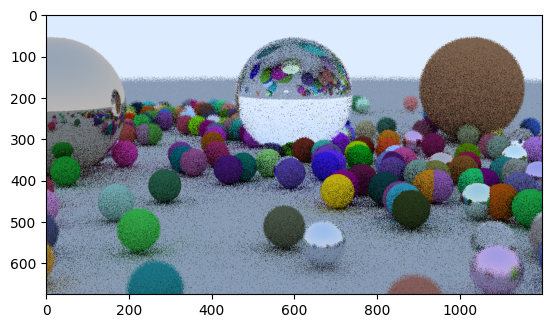

100%|████████████████████████████████████████████████████████████████████████████████████████| 675/675 [1:16:01<00:00,  6.76s/it]


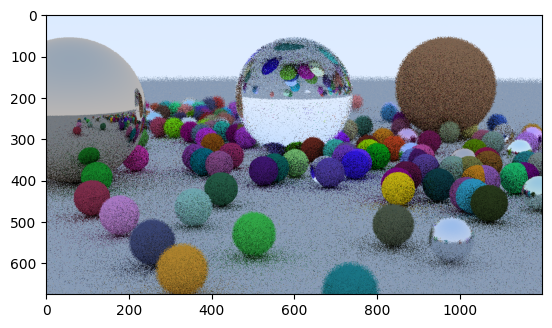

100%|██████████████████████████████████████████████████████████████████████████████████████████| 675/675 [42:41<00:00,  3.79s/it]


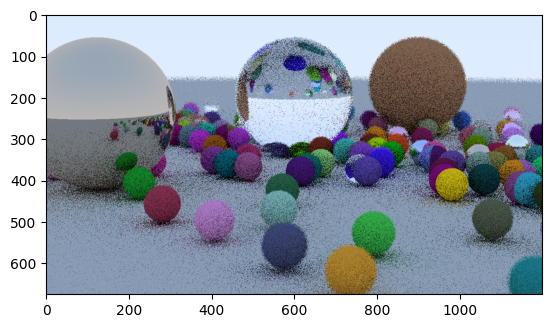

100%|████████████████████████████████████████████████████████████████████████████████████████| 675/675 [1:12:48<00:00,  6.47s/it]


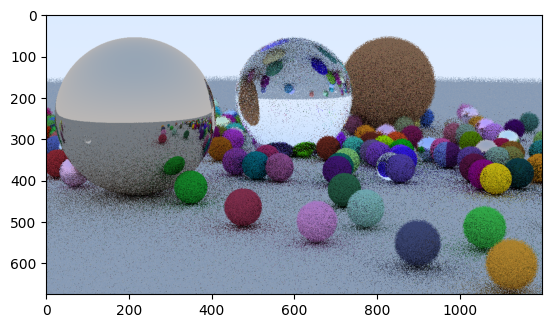

100%|██████████████████████████████████████████████████████████████████████████████████████████| 675/675 [10:57<00:00,  1.03it/s]


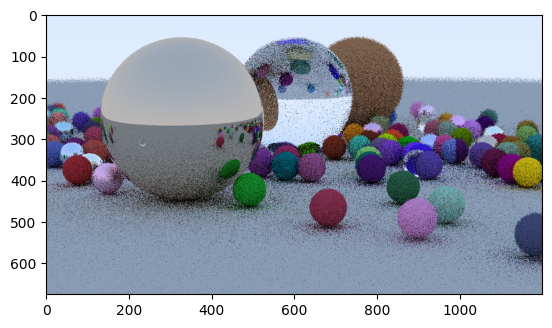

100%|██████████████████████████████████████████████████████████████████████████████████████████| 675/675 [10:32<00:00,  1.07it/s]


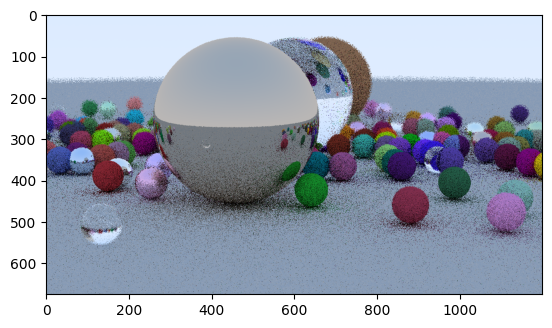

In [38]:

# Create PPM helper function
def create_ppm(ppm_file: str, image_width, image_height, samples_per_pixel, max_depth, pixel_color: Callable[[int, int], Color]) -> None:
    ppm_image = open(ppm_file, 'w')
    height = width = 256
    ppm_image.write(f"P3\n{image_width} {image_height}\n255\n")
    for h in tqdm(range(image_height)):
        for w in range(image_width):
            pixel_color = Color(0, 0, 0)
            for sample in range(samples_per_pixel):
                r = camera.get_ray(w,h)
                pixel_color += camera.ray_color(r, max_depth, world)

            ppm_image.write(write_color(pixel_color, samples_per_pixel))

    ppm_image.close()
    img = cv2.imread(ppm_file)
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.show()

class Camera:
    aspect_ratio      = 1.0
    image_width       = 100
    samples_per_pixel = 10
    max_depth         = 10  # maximum depth of the ray-color recursion -- maximum light bounces we will consider
    
    vfov              = 90             # vertical view angle (field of view)
    lookfrom          = Point(0,0,0)   # camera's origin
    lookat            = Point(0,0,-1)  # camera's viewing direction
    vup               = Vector3(0,1,0) # camera's vertical up direction

    defocus_angle     = 0
    focus_dist        = 0
    
    def render(self, world: Hittable) -> None:
        self.initialize()
        return create_ppm(ppm_file, self.image_width, self.image_height, self.samples_per_pixel, self.max_depth, functools.partial(solid_sphere_pixel_color, image_height, image_width, world))

    def initialize(self) -> None:
        global pixel_delta_u, pixel_delta_v, pixel00_loc, camera_center, defocus_disk_u, defocus_disk_v
        self.image_height = max(1, int(self.image_width / self.aspect_ratio))
       
    # Camera properties        
        theta = np.radians(self.vfov)
        h = np.tan(theta/2)

        viewport_height = 2 * h * self.focus_dist
        viewport_width = viewport_height * float(self.image_width) / float(self.image_height)

        camera_center = self.lookfrom
        
        self.w = (self.lookfrom - self.lookat).unit_vector()
        self.u = self.vup.cross(self.w).unit_vector()
        self.v = self.w.cross(self.u)
        
        viewport_u = self.u * viewport_width
        viewport_v = self.v * -viewport_height
        
        pixel_delta_u = viewport_u / self.image_width
        pixel_delta_v = viewport_v / self.image_height

        viewport_upper_left = camera_center - (self.w * self.focus_dist) - (viewport_u / 2) - (viewport_v / 2)
        pixel00_loc = viewport_upper_left + (pixel_delta_u + pixel_delta_v)*0.5
        defocus_radius = self.focus_dist * np.tan(np.radians(self.defocus_angle /2 ))
        defocus_disk_u = self.u * defocus_radius
        defocus_disk_v = self.v * defocus_radius
        
    def ray_color(self, ray: Ray, depth: int, world: Hittable) -> Color:
        if (depth <= 0):
            return Color(0, 0, 0)
        hit, rec = world.hit(ray, Interval(0.001, np.inf))
        if hit:
            scatter, scattered_ray, attenuation = rec.material.scatter(ray, rec)
            if scatter:
                return attenuation * self.ray_color(scattered_ray, depth - 1, world)
            return Color(0, 0, 0)

        unit_direction = ray.direction.unit_vector()
        a = (unit_direction.y + 1.0) * 0.5
        return Color(1.0, 1.0, 1.0) * (1.0 - a) + Color(0.5, 0.7, 1.0) * a

    def get_ray(self, i, j):
        offset = self.pixel_sample_square()
        pixel_sample = pixel00_loc + ((i + offset.x) * pixel_delta_u) + ((j + offset.y) * pixel_delta_v) 
        ray_origin = camera_center if self.defocus_angle <= 0 else self.defocus_disk_sample()
        ray_direction = Color(0,0,0)
        ray_direction.x = pixel_sample.x - ray_origin.x
        ray_direction.y = pixel_sample.y - ray_origin.y
        ray_direction.z = pixel_sample.z - ray_origin.z
        return Ray(ray_origin, ray_direction)
    
    def defocus_disk_sample(self):
        p = Vector3.random_in_unit_disk()
        return camera_center + (p.x * defocus_disk_u) + (p.y * defocus_disk_v)
    
    def pixel_sample_square(self):
        px = -0.5 + random.uniform(0,1)
        py = -0.5 + random.uniform(0,1)
        return px * pixel_delta_u + py * pixel_delta_v

world: HittableList = HittableList()
    
material_ground = Lambertian(Color(0.5, 0.5, 0.5))
world.add(Sphere(Point(0, -1000, 0), 1000, material_ground))

for a in range(-8, 8):
    for b in range(-8, 8):
        choose_mat = random.uniform(0,1)
        center = Point(a * 0.9 * random.uniform(0,1), 0.2, b + 0.9 * random.uniform(0,1))
        if (center - Point(4,0.2,0)).length() > 0.9:
            if choose_mat < 0.8:
                albeto = Color(random.uniform(0,1), random.uniform(0,1), random.uniform(0,1)) * Color(random.uniform(0,1), random.uniform(0,1), random.uniform(0,1))
                sphere_material = Lambertian(albeto)
                world.add(Sphere(center, 0.2, sphere_material))
            elif choose_mat < 0.95:
                fuzz   = random.uniform(0, 0.5)
                albeto = Color(random.uniform(0.5,1), random.uniform(0.5,1), random.uniform(0.5,1))
                sphere_material = Metal(albeto, fuzz)
                world.add(Sphere(center, 0.2, sphere_material))   
            else:
                sphere_material = Dielectric(index_of_refraction = 1.5)
                world.add(Sphere(center, 0.2, sphere_material))
            
            
material1 = Dielectric(index_of_refraction = 1.5)
world.add(Sphere(Point(0, 1, 0), 1., material1))

material2 = Lambertian(Color(0.4, 0.2, 0.1))
world.add(Sphere(Point(-4, 1, 0), 1, material2))

material3 = Metal(Color(0.7, 0.6, 0.5), 0.0)
world.add(Sphere(Point(4, 1, 0), 1, material3))

camera: Camera = Camera()
camera.aspect_ratio = 16.0 / 9.0
camera.image_width = 1200
camera.samples_per_pixel = 1
camera.max_depth = 50

camera.vfov = 20
camera.lookfrom = Point(13, 2, 3)
camera.lookat = Point(0.0, 0.0, 0.0)
camera.vup = Vector3(0.0, 1.0, 0.0)

camera.defocus_angle = 0.6
camera.focus_dist = 10

num_frames = 36
angle_increment = 10

radius = (camera.lookfrom - camera.lookat).length()

for frame in range(num_frames):
    angle = math.radians(frame * angle_increment)
    camera_x = camera.lookat.x + radius * math.cos(angle)
    camera_z = camera.lookat.z + radius * math.sin(angle)
    camera.lookfrom = Point(camera_x, camera.lookfrom.y, camera_z)
    camera.render(world)